# Projet Deep Learning
by Thomas ODIN, Maïa JOUENNE et Benoit CATEZ

## Import et telechargement des paquets necessaires

In [21]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random
import cv2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf

## 1) Classification

### Crop et annotation

Number of valid cropped images: 2075
Number of proposed images: 2077
Image sizes:
(106, 169, 3)    6
(70, 64, 3)      6
(43, 72, 3)      4
(2, 1, 3)        4
(131, 262, 3)    4
                ..
(93, 56, 3)      1
(87, 41, 3)      1
(72, 70, 3)      1
(51, 61, 3)      1
(53, 84, 3)      1
Name: cropped_image, Length: 1023, dtype: int64


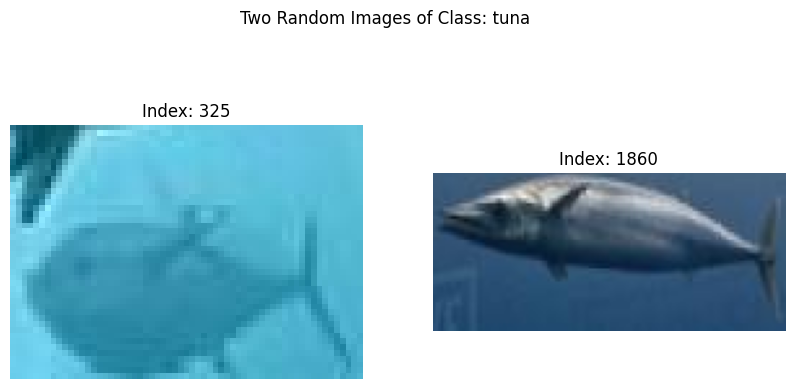

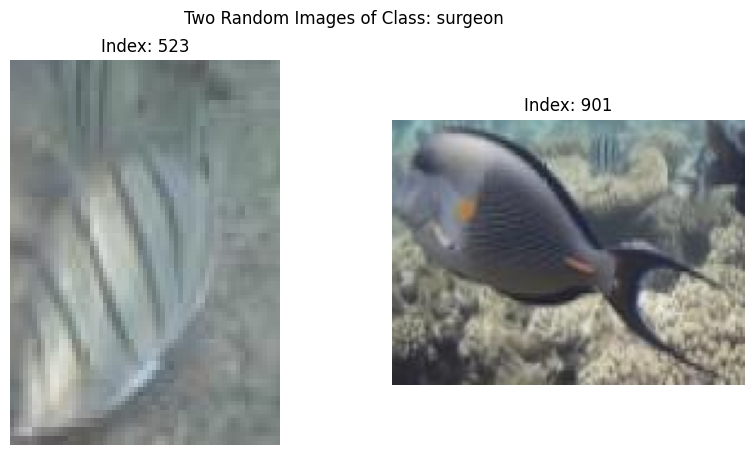

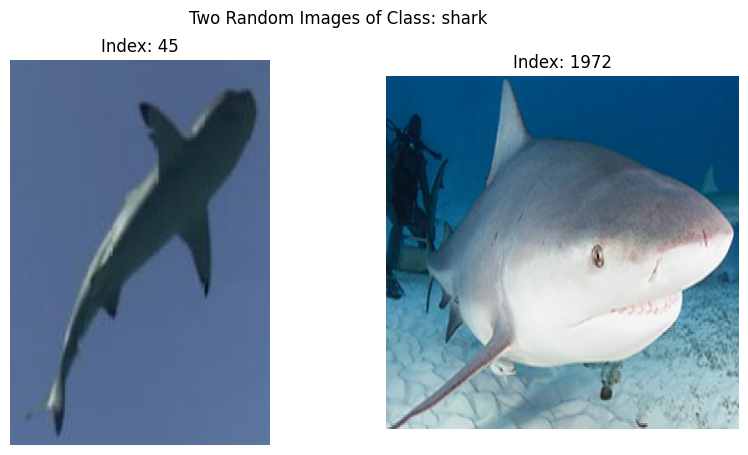

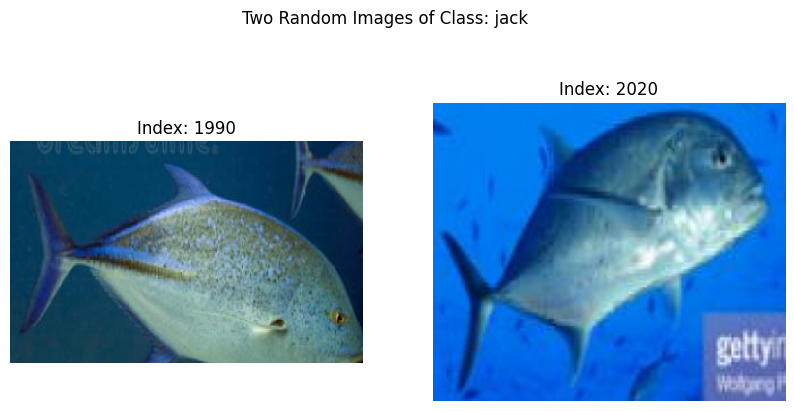

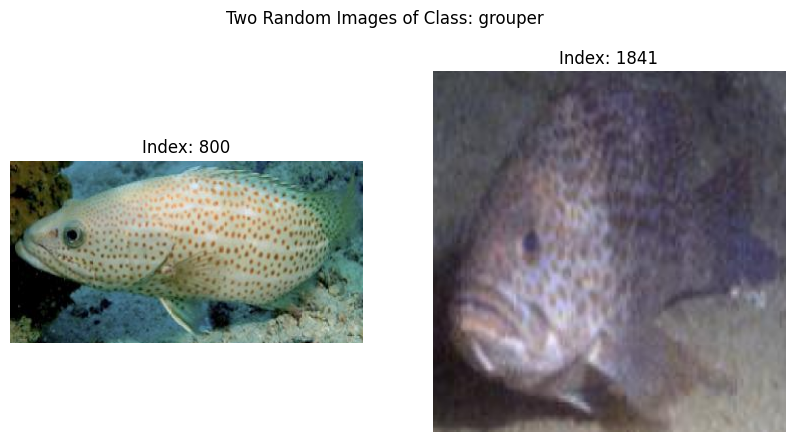

...

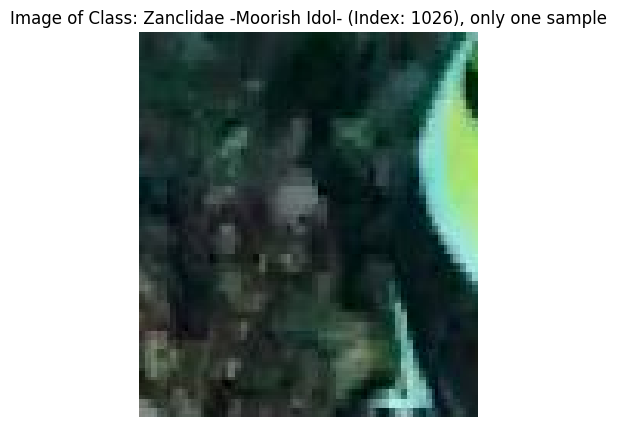

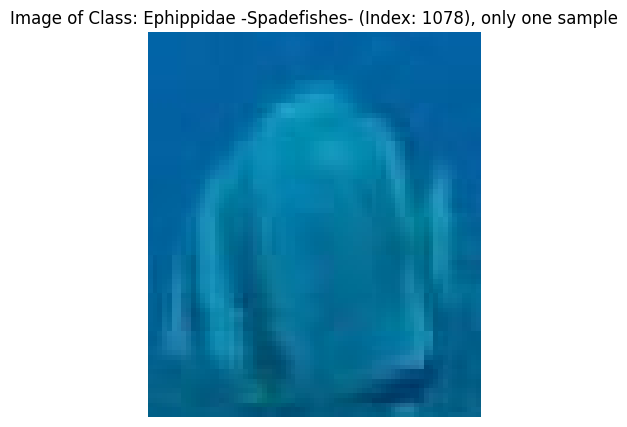

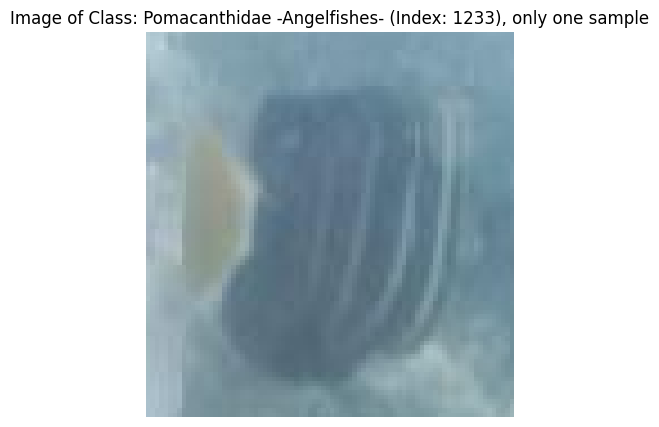

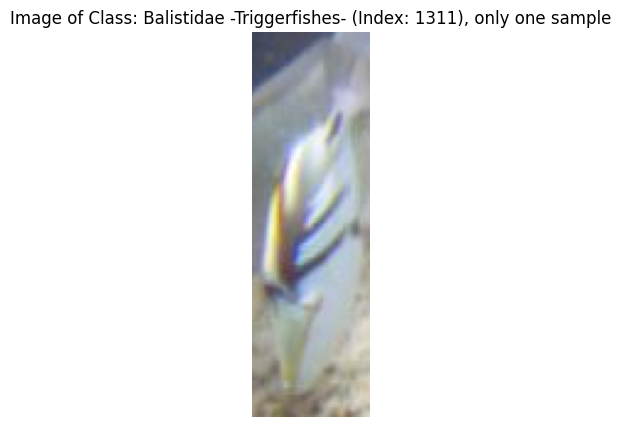

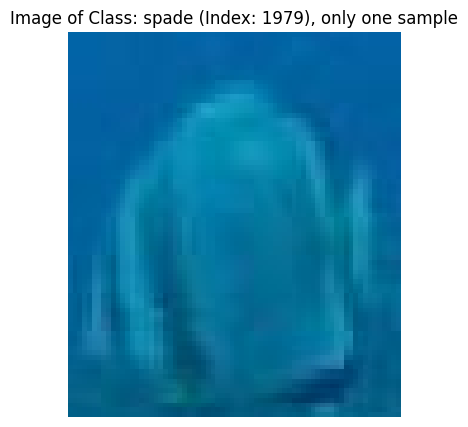

In [22]:
# Read the CSV file into a DataFrame
df_train = pd.read_csv('data/train/_annotations.csv')

# Read and store cropped images
cropped_image_list = []

for index, row in df_train.iterrows():
    image_path = row['filename']
    image = Image.open('data/train/' + image_path)

    # Extract cropping coordinates
    xmin, ymin, xmax, ymax = (
        max(0, row['xmin']),
        max(0, row['ymin']),
        min(image.width, row['xmax']),
        min(image.height, row['ymax'])
    )

    # Check if the adjusted coordinates are valid
    if xmin < xmax and ymin < ymax:
        # Crop the image
        cropped_image = np.array(image.crop((xmin, ymin, xmax, ymax)))

        # Store the cropped image in the list
        cropped_image_list.append(cropped_image)
    else:
        # If the coordinates are invalid, append a placeholder (e.g., None)
        cropped_image_list.append(None)

# Add a new column to the DataFrame with cropped images
df_train['cropped_image'] = cropped_image_list

# Filter out rows with None values in the 'cropped_image' column
df_valid_crops = df_train.dropna(subset=['cropped_image'])

# Display general information
print("Number of valid cropped images:", len(df_valid_crops))
print("Number of proposed images:", len(df_train))
print("Image sizes:")
print(df_valid_crops['cropped_image'].apply(lambda x: x.shape).value_counts())

# Get unique classes in the DataFrame
unique_classes = df_valid_crops['class'].unique()

# Number of random images to plot for each class
images_to_plot = 2

# Plot two random images for each class
for class_name in unique_classes:
    # Filter DataFrame based on the current class
    df_same_class = df_valid_crops[df_valid_crops['class'] == class_name]

    # Check the number of images in the current class
    num_images = len(df_same_class)

    if num_images >= images_to_plot:
        # Randomly select two images from the current class
        random_indices = random.sample(df_same_class.index.tolist(), images_to_plot)

        # Plot the two random images for the current class
        fig, axes = plt.subplots(1, images_to_plot, figsize=(10, 5))
        fig.suptitle(f'Two Random Images of Class: {class_name}')

        for i, ax in enumerate(axes):
            ax.imshow(df_same_class.loc[random_indices[i]]['cropped_image'])
            ax.set_title(f"Index: {random_indices[i]}")
            ax.axis('off')

        plt.show()
        
    elif num_images == 1:
        # Plot the single image for the current class
        plt.figure(figsize=(5, 5))
        plt.imshow(df_same_class.iloc[0]['cropped_image'])
        plt.title(f'Image of Class: {class_name} (Index: {df_same_class.index[0]}), only one sample')
        plt.axis('off')
        plt.show()
    else:
        print(f"No images of class '{class_name}' for plotting.")


We can see that some of the classes are the same but with different name and that some of the picture are very pixelized. So we are going to do some mapping for the classes and create a function to automate the recuperation of the data. We can also see that due to the cropping the image are all of different size so after we are going to resize them into the same size the biggest one

In [23]:
unique_classes

array(['tuna', 'surgeon', 'shark', 'jack', 'grouper', 'parrot', 'snapper',
       'damsel', 'trigger', 'Zanclidae (Moorish Idol)',
       'Scaridae -Parrotfishes-', 'Carangidae -Jacks-',
       'Scombridae -Tunas-', 'Shark -Selachimorpha-',
       'Serranidae -Groupers-', 'Lutjanidae -Snappers-',
       'Acanthuridae -Surgeonfishes-', 'Pomacentridae -Damselfishes-',
       'Labridae -Wrasse-', 'angel', 'wrasse', 'Zanclidae -Moorish Idol-',
       'Ephippidae -Spadefishes-', 'Pomacanthidae -Angelfishes-',
       'Balistidae -Triggerfishes-', 'spade'], dtype=object)

In [24]:
old_class_to_actual_class = {
    'tuna' : 'tuna', 
    'surgeon': 'surgeon', 
    'shark': 'shark', 
    'jack': 'jack', 
    'grouper': 'grouper', 
    'parrot': 'parrot', 
    'snapper': 'snapper',
    'damsel': 'damsel', 
    'trigger': 'trigger', 
    'Zanclidae (Moorish Idol)': 'moorish idol',
    'Scaridae -Parrotfishes-': 'parrot', 
    'Carangidae -Jacks-': 'jack',
    'Scombridae -Tunas-': 'tuna', 
    'Shark -Selachimorpha-': 'shark',
    'Serranidae -Groupers-': 'grouper', 
    'Lutjanidae -Snappers-': 'snapper',
    'Acanthuridae -Surgeonfishes-': 'surgeon', 
    'Pomacentridae -Damselfishes-': 'damsel',
    'Labridae -Wrasse-': 'wrasse', 
    'angel': 'angel', 
    'wrasse': 'wrasse', 
    'Zanclidae -Moorish Idol-': 'moorish idol',
    'Ephippidae -Spadefishes-': 'spade', 
    'Pomacanthidae -Angelfishes-': 'angel',
    'Balistidae -Triggerfishes-': 'trigger', 
    'spade': 'spade'
}

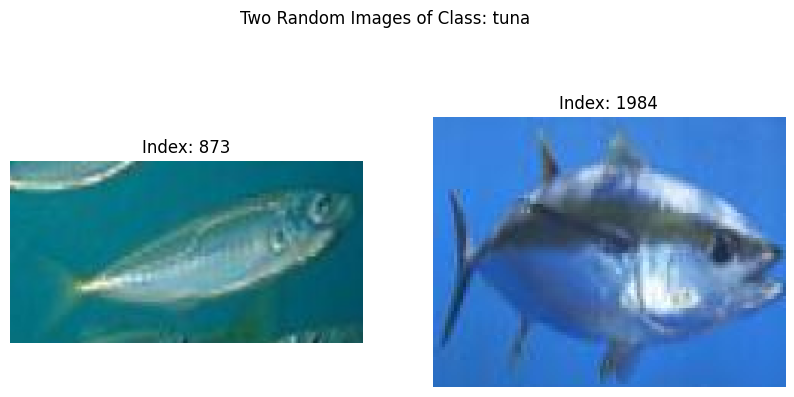

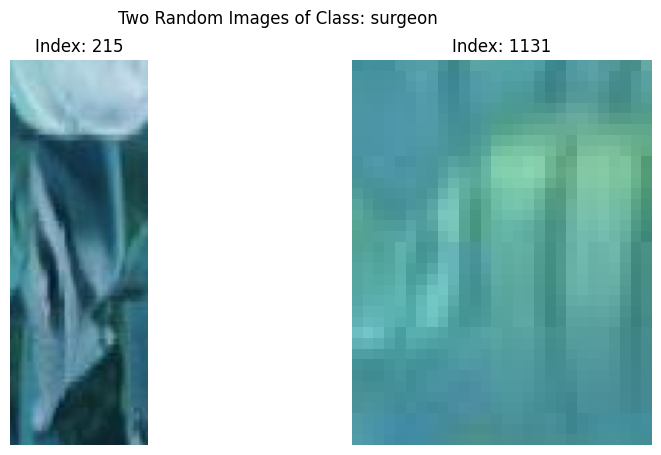

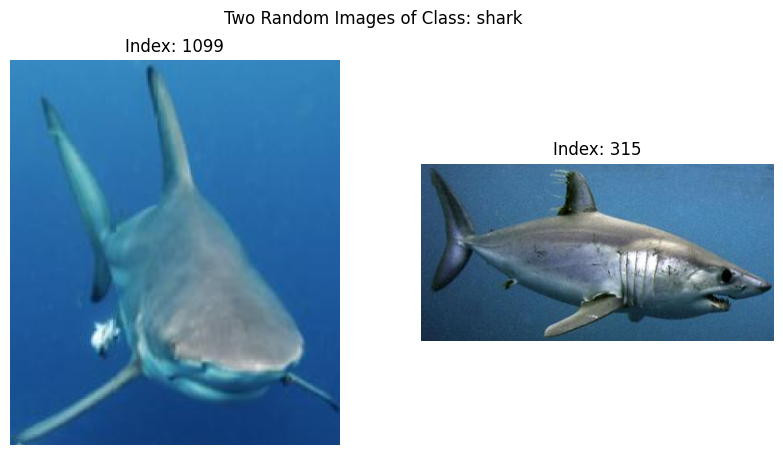

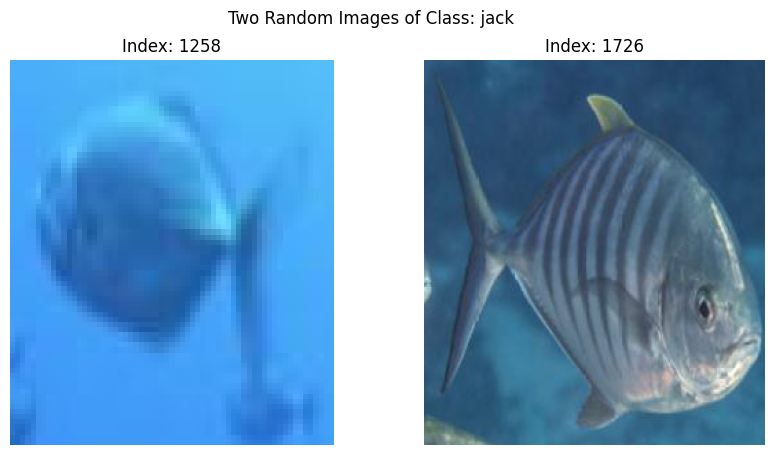

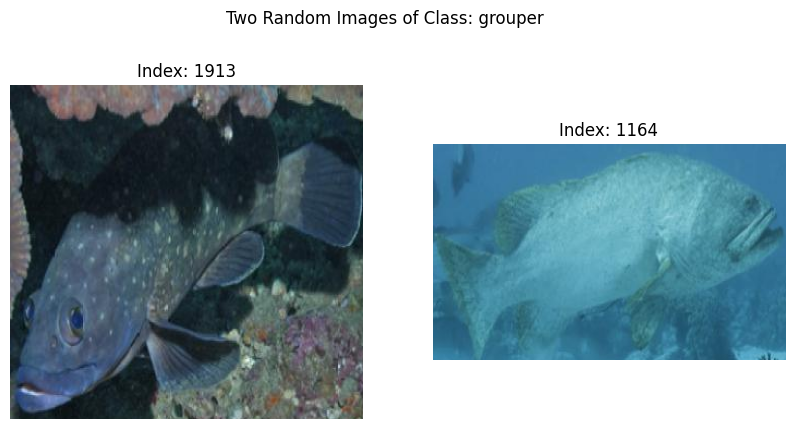

...

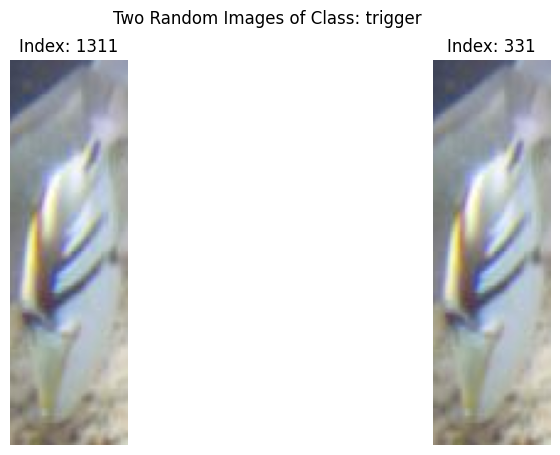

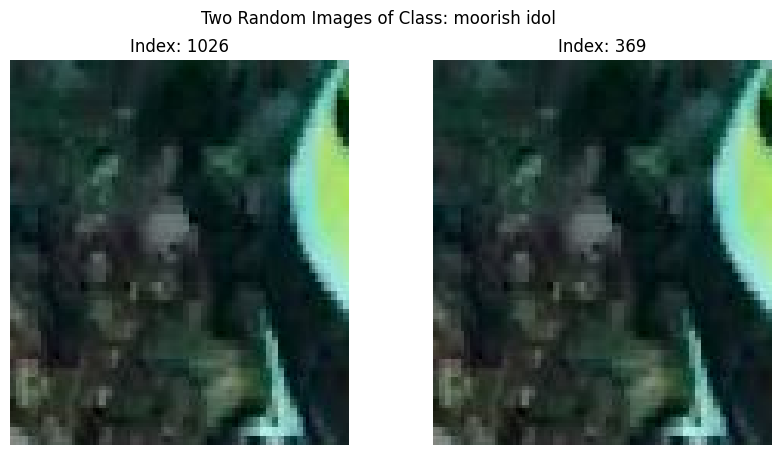

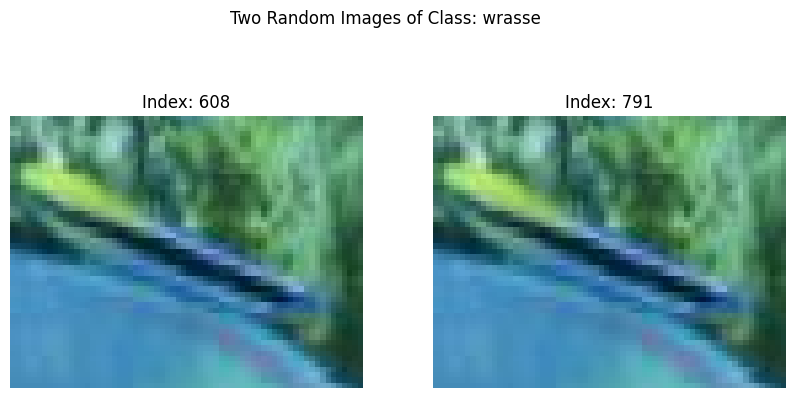

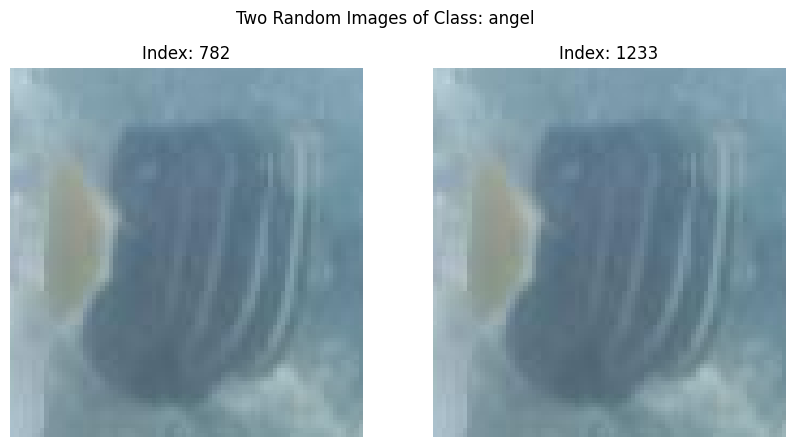

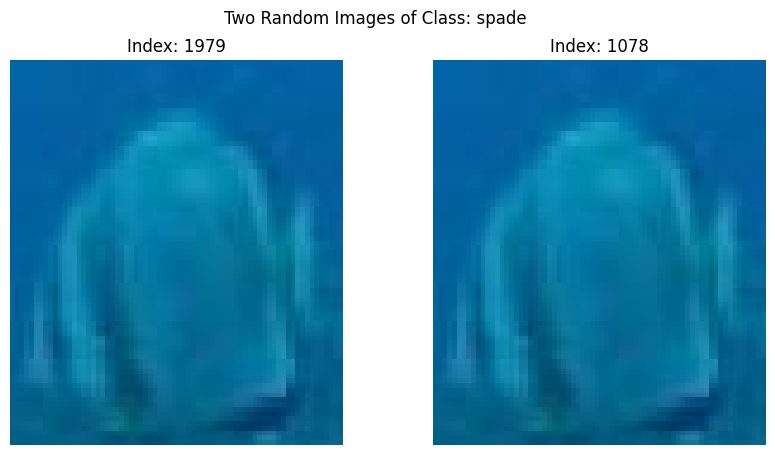

In [25]:
# Copy valid dataframe 
df_new_class = df_valid_crops.copy()

# Replace old class names with new class names
df_new_class['class'] = df_new_class['class'].replace(old_class_to_actual_class)

# Get unique classes in the DataFrame
unique_classes = df_new_class['class'].unique()

# Number of random images to plot for each class
images_to_plot = 2

# Plot two random images for each class
for class_name in unique_classes:
    # Filter DataFrame based on the current class
    df_same_class = df_new_class[df_new_class['class'] == class_name]

    # Check the number of images in the current class
    num_images = len(df_same_class)

    if num_images >= images_to_plot:
        # Randomly select two images from the current class
        random_indices = random.sample(df_same_class.index.tolist(), images_to_plot)

        # Plot the two random images for the current class
        fig, axes = plt.subplots(1, images_to_plot, figsize=(10, 5))
        fig.suptitle(f'Two Random Images of Class: {class_name}')

        for i, ax in enumerate(axes):
            ax.imshow(df_same_class.loc[random_indices[i]]['cropped_image'])
            ax.set_title(f"Index: {random_indices[i]}")
            ax.axis('off')

        plt.show()
    elif num_images == 1:
        # Plot the single image for the current class
        plt.figure(figsize=(5, 5))
        plt.imshow(df_same_class.iloc[0]['cropped_image'])
        plt.title(f'Image of Class: {class_name} (Index: {df_same_class.index[0]}), only one sample')
        plt.axis('off')
        plt.show()
    else:
        print(f"No images of class '{class_name}' for plotting.")

In [26]:
df_new_class['class'].value_counts()

surgeon         534
jack            376
tuna            333
snapper         299
shark           188
parrot          176
grouper         147
damsel           12
trigger           2
moorish idol      2
wrasse            2
angel             2
spade             2
Name: class, dtype: int64

We can see that there is some of the data which is underreepresented as told in the website 

We are now going to look at the size of the images and reshape them

In [27]:
df_valid_crops['cropped_image'].apply(lambda x: x.shape).value_counts().sort_index()

(2, 1, 3)        4
(18, 27, 3)      2
(19, 25, 3)      2
(23, 26, 3)      2
(24, 27, 3)      2
                ..
(402, 388, 3)    2
(406, 291, 3)    2
(409, 363, 3)    2
(410, 334, 3)    2
(411, 415, 3)    2
Name: cropped_image, Length: 1023, dtype: int64

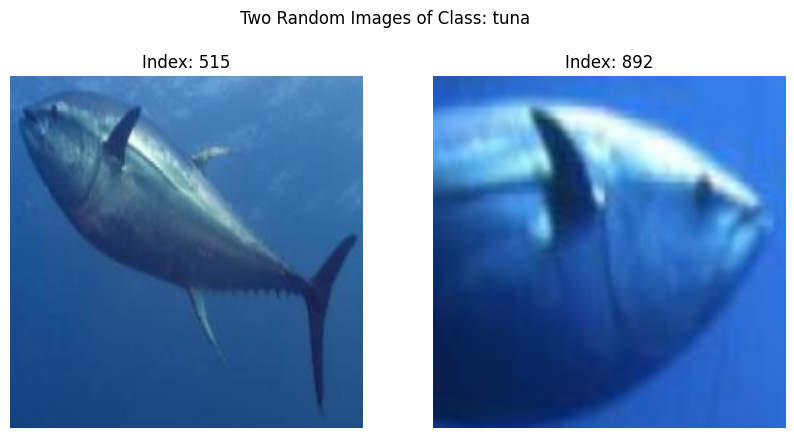

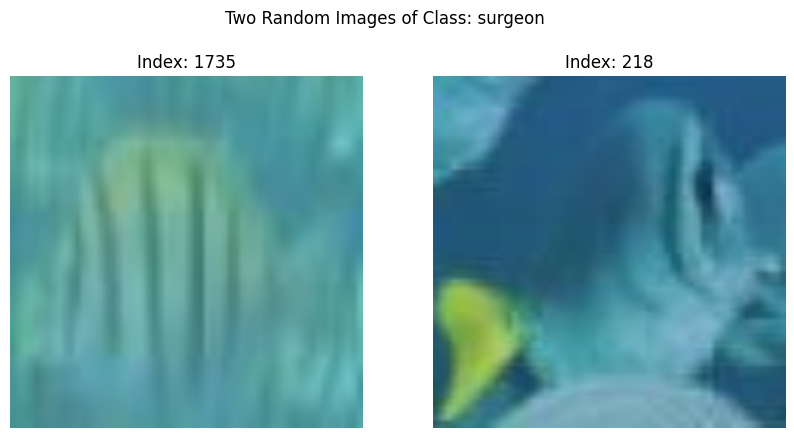

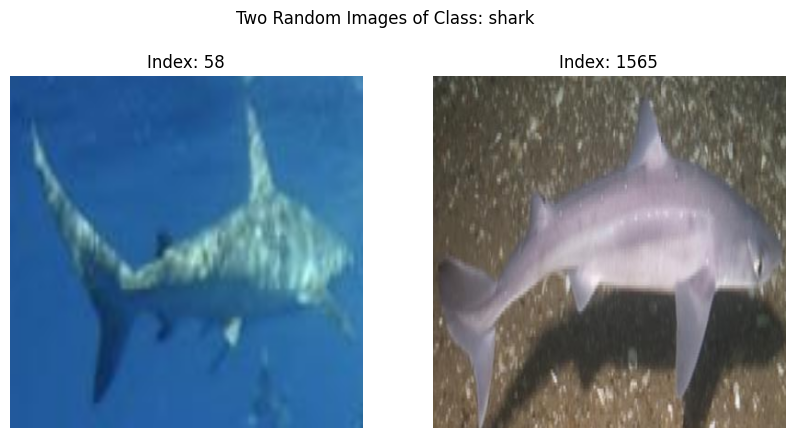

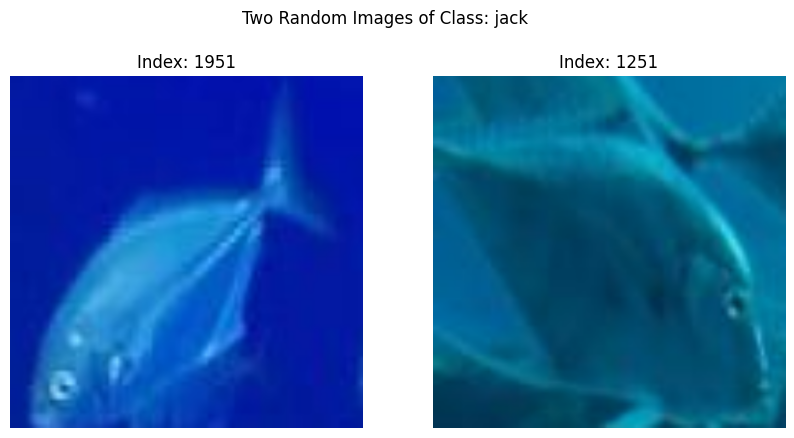

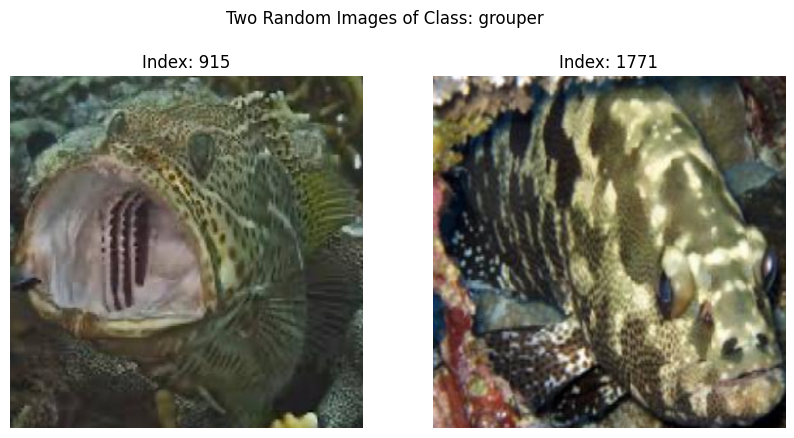

...

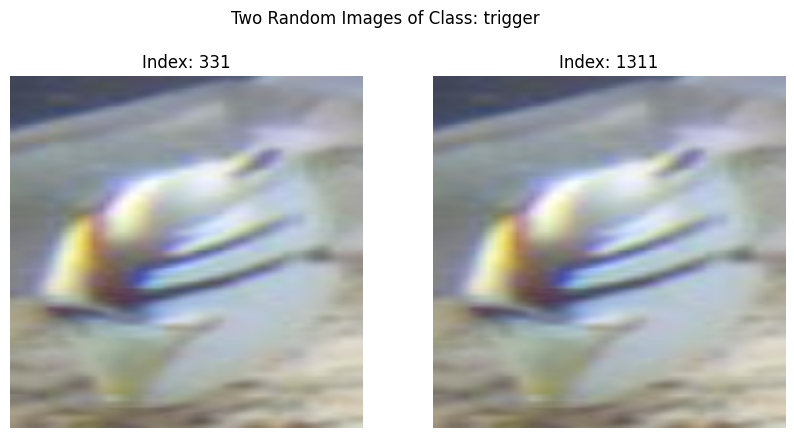

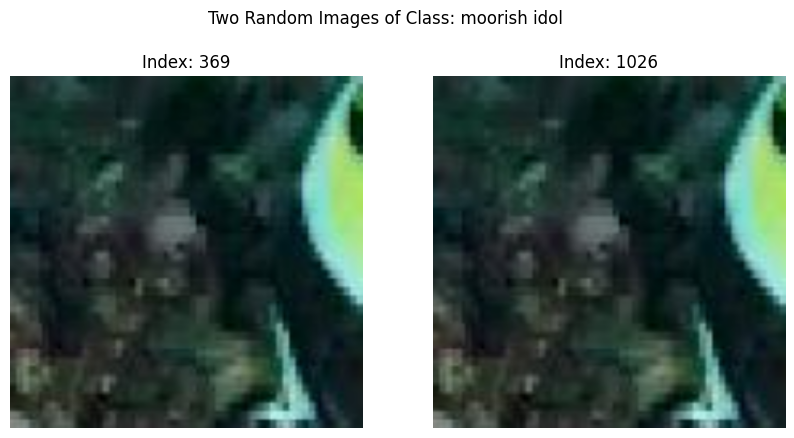

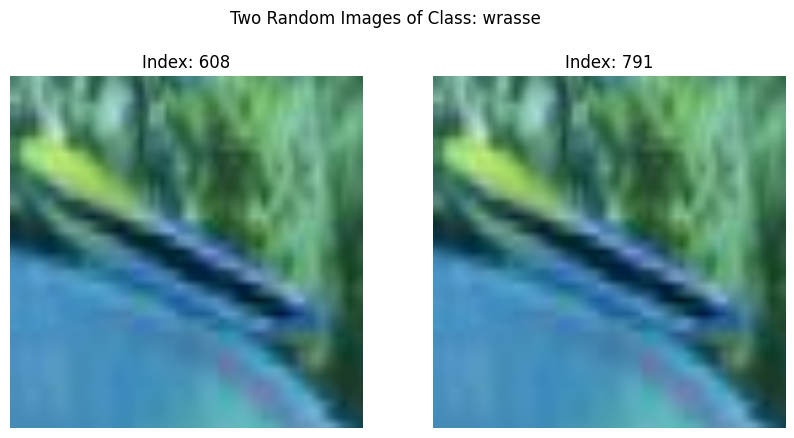

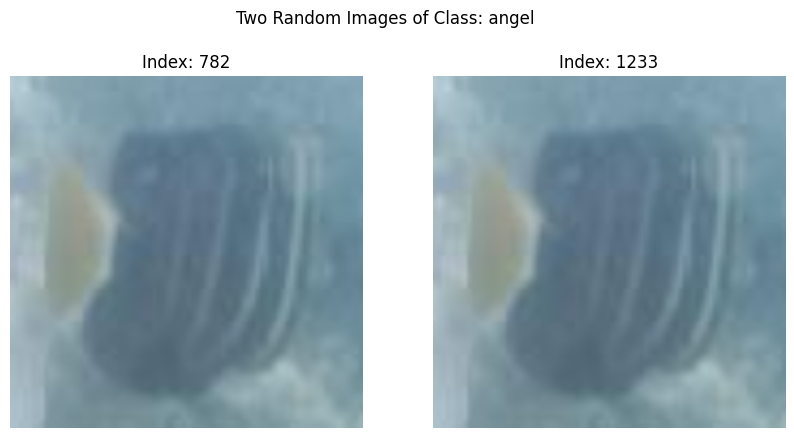

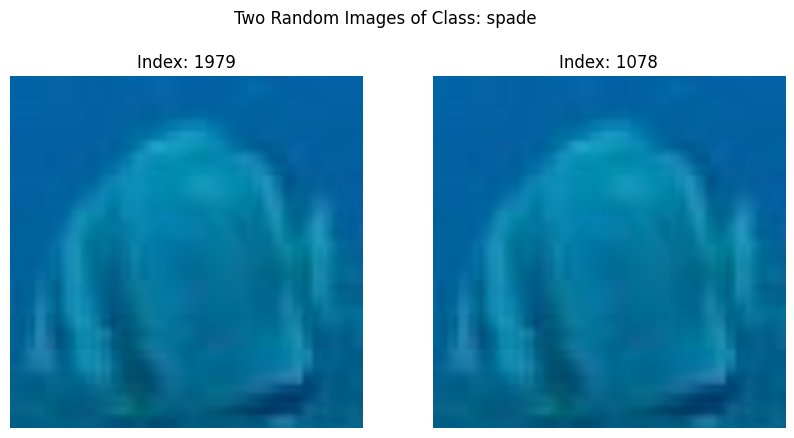

In [28]:
# Define the target size for resizing
target_size = (415, 415)  # Specify the desired width and height

# Reshape the images in the 'cropped_image' column
df_new_class['cropped_image'] = df_new_class['cropped_image'].apply(lambda x: cv2.resize(x, target_size) if x is not None else None)

# Get unique classes in the DataFrame
unique_classes = df_new_class['class'].unique()

# Number of random images to plot for each class
images_to_plot = 2

# Plot two random images for each class
for class_name in unique_classes:
    # Filter DataFrame based on the current class
    df_same_class = df_new_class[df_new_class['class'] == class_name]

    # Check the number of images in the current class
    num_images = len(df_same_class)

    if num_images >= images_to_plot:
        # Randomly select two images from the current class
        random_indices = random.sample(df_same_class.index.tolist(), images_to_plot)

        # Plot the two random images for the current class
        fig, axes = plt.subplots(1, images_to_plot, figsize=(10, 5))
        fig.suptitle(f'Two Random Images of Class: {class_name}')

        for i, ax in enumerate(axes):
            ax.imshow(df_same_class.loc[random_indices[i]]['cropped_image'])
            ax.set_title(f"Index: {random_indices[i]}")
            ax.axis('off')

        plt.show()
    elif num_images == 1:
        # Plot the single image for the current class
        plt.figure(figsize=(5, 5))
        plt.imshow(df_same_class.iloc[0]['cropped_image'])
        plt.title(f'Image of Class: {class_name} (Index: {df_same_class.index[0]}), only one sample')
        plt.axis('off')
        plt.show()
    else:
        print(f"No images of class '{class_name}' for plotting.")

### Functions for crop 

In [29]:
def read_and_crop(path):
    
    # Read the CSV file into a DataFrame
    if path[-1] == '/':
        df = pd.read_csv(path +'_annotations.csv')
    else :
        df = pd.read_csv(path +'/_annotations.csv')

    # Read and store cropped images
    cropped_image_list = []

    for index, row in df.iterrows():
        image_path = row['filename']
        if path[-1] == '/':
            image = Image.open(path + image_path)
        else :
            image = Image.open(path + '/' + image_path)
            

        # Extract cropping coordinates
        xmin, ymin, xmax, ymax = (
            max(0, row['xmin']),
            max(0, row['ymin']),
            min(image.width, row['xmax']),
            min(image.height, row['ymax'])
        )

        # Check if the adjusted coordinates are valid
        if xmin < xmax and ymin < ymax:
            
            # Crop the image
            cropped_image = np.array(image.crop((xmin, ymin, xmax, ymax))) 

            # Reshape the images in the 'cropped_image' column
            cropped_reshape_image = cv2.resize(cropped_image, (171, 138))

            # Store the cropped image in the list
            cropped_image_list.append(cropped_reshape_image)
        else:
            # If the coordinates are invalid, append a placeholder (e.g., None)
            cropped_image_list.append(None)

    # Add a new column to the DataFrame with cropped images
    df['cropped_image'] = cropped_image_list.copy()

    # Filter out rows with None values in the 'cropped_image' column
    df_valid_crops = df.dropna(subset=['cropped_image']).copy()
    
    df_final = df_valid_crops[['class', 'cropped_image']].copy()
    
    
    old_class_to_actual_class = {
        'tuna' : 'tuna', 
        'surgeon': 'surgeon', 
        'shark': 'shark', 
        'jack': 'jack', 
        'grouper': 'grouper', 
        'parrot': 'parrot', 
        'snapper': 'snapper',
        'damsel': 'damsel', 
        'trigger': 'trigger', 
        'Zanclidae (Moorish Idol)': 'moorish idol',
        'Scaridae -Parrotfishes-': 'parrot', 
        'Carangidae -Jacks-': 'jack',
        'Scombridae -Tunas-': 'tuna', 
        'Shark -Selachimorpha-': 'shark',
        'Serranidae -Groupers-': 'grouper', 
        'Lutjanidae -Snappers-': 'snapper',
        'Acanthuridae -Surgeonfishes-': 'surgeon', 
        'Pomacentridae -Damselfishes-': 'damsel',
        'Labridae -Wrasse-': 'wrasse', 
        'angel': 'angel', 
        'wrasse': 'wrasse', 
        'Zanclidae -Moorish Idol-': 'moorish idol',
        'Ephippidae -Spadefishes-': 'spade', 
        'Pomacanthidae -Angelfishes-': 'angel',
        'Balistidae -Triggerfishes-': 'trigger', 
        'spade': 'spade'
    }
   
    # Replace old class names with new class names
    df_final['class'] = df_final['class'].replace(old_class_to_actual_class)
    
    return df_final


def print_image_by_classes(df,images_to_plot):
    
    # Get unique classes in the DataFrame
    unique_classes = df['class'].unique()

    # Plot two random images for each class
    for class_name in unique_classes:
        # Filter DataFrame based on the current class
        df_same_class = df[df['class'] == class_name]

        # Check the number of images in the current class
        num_images = len(df_same_class)

        if num_images >= images_to_plot:
            # Randomly select two images from the current class
            random_indices = random.sample(df_same_class.index.tolist(), images_to_plot)

            # Plot the two random images for the current class
            fig, axes = plt.subplots(1, images_to_plot, figsize=(10, 5))
            fig.suptitle(f'Two Random Images of Class: {class_name}')

            for i, ax in enumerate(axes):
                ax.imshow(df_same_class.loc[random_indices[i]]['cropped_image'])
                ax.set_title(f"Index: {random_indices[i]}")
                ax.axis('off')

            plt.show()
            continue
            
        elif num_images >= 1:
            # Plot the single image for the current class
            plt.figure(figsize=(5, 5))
            plt.imshow(df_same_class.iloc[0]['cropped_image'])
            plt.title(f'Image of Class: {class_name} (Index: {df_same_class.index[0]})')
            plt.axis('off')
            plt.show()
            continue
            
        else:
            print(f"No images of class '{class_name}' for plotting.")


In [30]:
# function to ressort the X and y of dataframe
def to_work(df):
    
    class_to_number = {
    'tuna': 0, 
    'surgeon': 1, 
    'shark': 2, 
    'jack': 3, 
    'grouper': 4, 
    'parrot': 5, 
    'snapper': 6,
    'damsel': 7, 
    'trigger': 8, 
    'moorish idol': 9, 
    'wrasse': 10, 
    'angel': 11, 
    'spade': 12
}

    X = np.stack(df['cropped_image'].to_numpy().copy(), axis=0)
    
    # standardize and center data (make my pc crash)
    X = (X / 255) - 0.5
    
    y = df['class'].replace(class_to_number).to_numpy().copy()
    y_cat = to_categorical(y, num_classes=13)  
    
    return X, y, y_cat 

df_test = read_and_crop('data/test/')
X_test, y_test, y_test_cat = to_work(df_test)
y_test_cat.shape

(414, 13)

In [31]:
df_train = read_and_crop('data/train/')
df_test = read_and_crop('data/test/')
df_valid = read_and_crop('data/valid/')

### Classification

#### Création du modèle

In [32]:
def init_model():
    
    # Start by creating a sequential model
    model = models.Sequential()
    
    ### First Convolution & MaxPooling
    model.add(layers.Conv2D(8, (4, 4), activation='relu', padding='same', input_shape=(138, 171, 3)))
    model.add(layers.MaxPooling2D((2, 2)))

    ### Second Convolution & MaxPoolingialize
    model.add(layers.Conv2D(16, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    ### Flattening
    model.add(layers.Flatten())

    ### One Fully Connected layer
    model.add(layers.Dense(10, activation='relu'))
    # droupout to minimise the overfitting
    model.add(layers.Dropout(0.3))
    ### Last layer - Classification Layer
    model.add(layers.Dense(13, activation='softmax')) # softmax for multiclass classification

    ### Model compilation
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'Precision','Recall'])
    
    return model
    

#### Entrainement et Evaluation du modele

In [33]:
# to plot the result
def plot_history(history):
    fig, axs = plt.subplots(4,1, figsize=(10,10))
    
    axs[0].plot(history.history['loss'], color='red', label='train')
    axs[0].plot(history.history['val_loss'], color='blue', label='val')
    axs[0].set_title('Loss')
    axs[0].legend(['train', 'test'],loc="upper right")
    
    axs[1].plot(history.history['accuracy'], color='red', label='train')
    axs[1].plot(history.history['val_accuracy'], color='blue', label='val')
    axs[1].set_title('Accuracy ')
    axs[1].legend(['train', 'test'],loc="upper right")

    axs[2].plot(history.history['precision'], color='red', label='train')
    axs[2].plot(history.history['val_precision'], color='blue', label='val')
    axs[2].set_title('Precision ')
    axs[2].legend(['train', 'test'],loc="upper right")

    axs[3].plot(history.history['recall'], color='red', label='train')
    axs[3].plot(history.history['val_recall'], color='blue', label='val')
    axs[3].set_title('Recall')
    axs[3].legend(['train', 'test'],loc="upper right")
    

    for ax in axs.flat:
        ax.set(xlabel='Epoch', ylabel='')

    # Hide x labels and tick labels for top plots and y ticks for right plots.
    for ax in axs.flat:
        ax.label_outer()
        
    plt.show()

In [34]:
X_train, y_train, y_train_cat = to_work(df_train)
X_test, y_test, y_test_cat = to_work(df_test)
X_val, y_val, y_val_cat = to_work(df_valid)

------------------------------------------Batch Size 4------------------------------------------


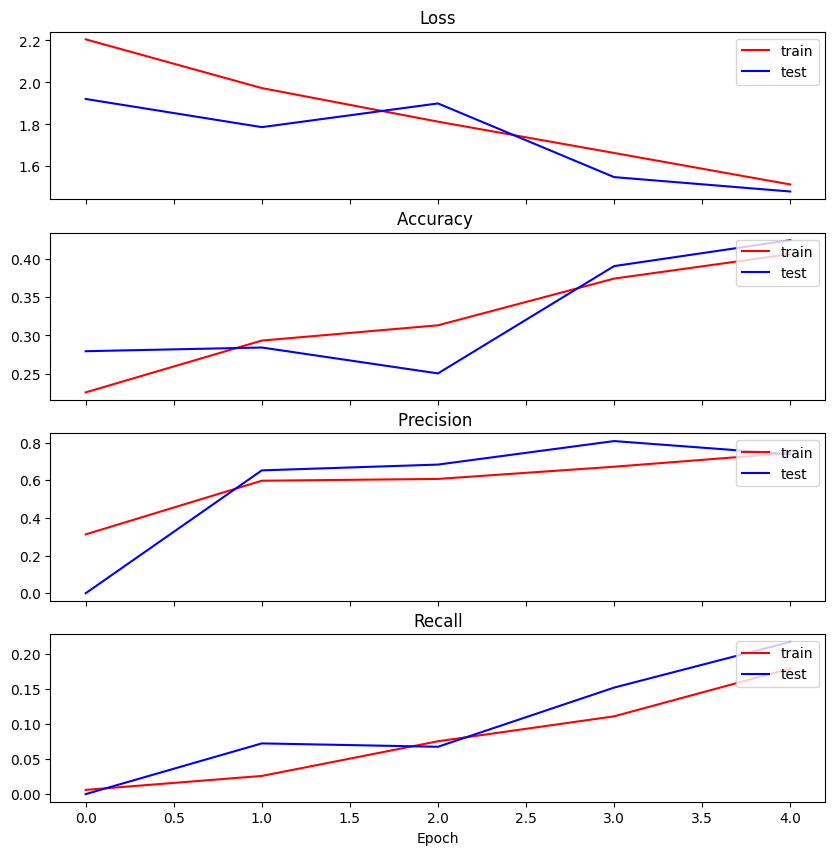

         Model Evaluation on Training :
     Training Loss:     1.2172324657440186
   Training Accuracy:   0.5368674993515015
  Training Precision:   0.8753993511199951
    Training Recall:    0.26409637928009033 

         Model Evaluation on Validation :
    Validation Loss:    1.6831531524658203
  Validation Accuracy:  0.3717357814311981
 Validation Precision:  0.5526315569877625
   Validation Recall:   0.12903225421905518
------------------------------------------Batch Size 16------------------------------------------


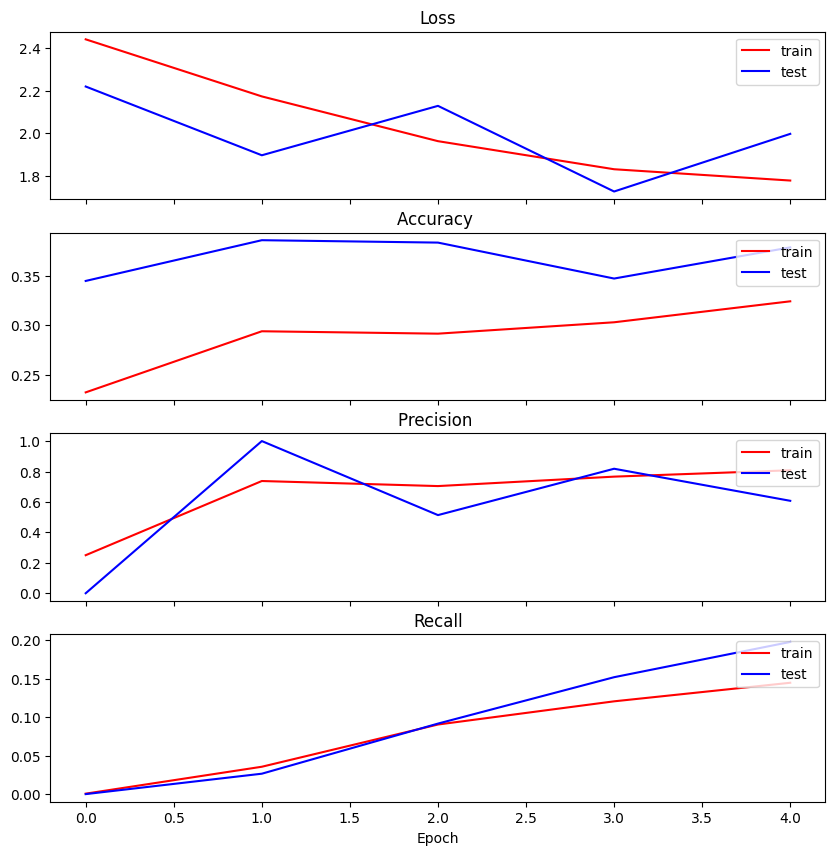

         Model Evaluation on Training :
     Training Loss:     1.6065977811813354
   Training Accuracy:   0.4771084189414978
  Training Precision:   0.7286432385444641
    Training Recall:    0.2096385508775711 

         Model Evaluation on Validation :
    Validation Loss:    2.0158193111419678
  Validation Accuracy:  0.3748079836368561
 Validation Precision:  0.5443037748336792
   Validation Recall:   0.13210445642471313
------------------------------------------Batch Size 32------------------------------------------


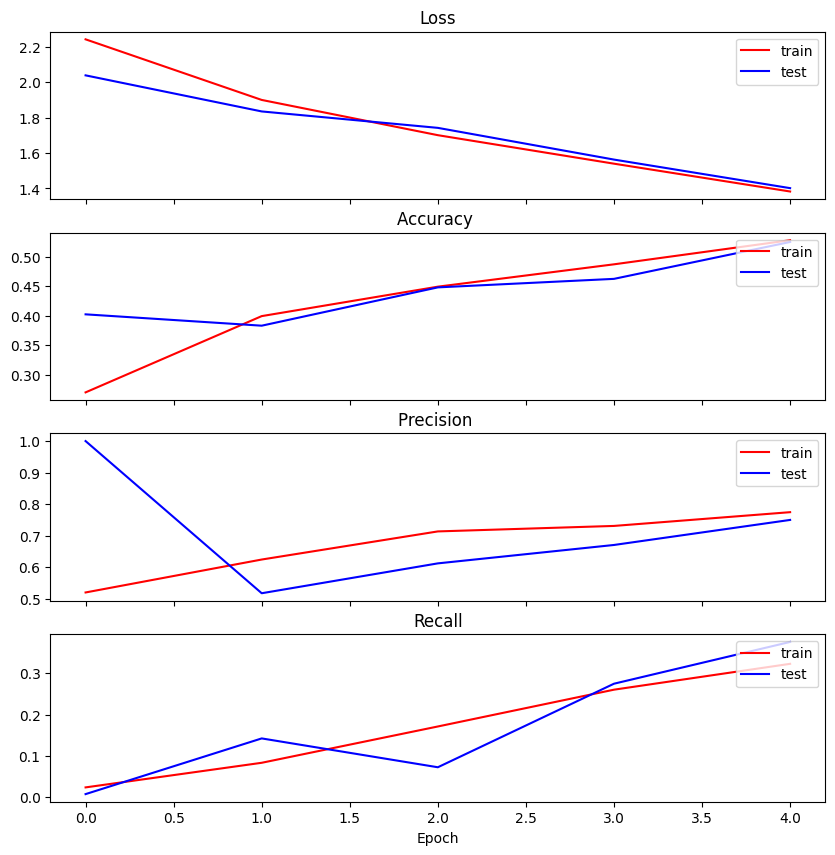

         Model Evaluation on Training :
     Training Loss:     1.1162792444229126
   Training Accuracy:   0.6067469716072083
  Training Precision:   0.859078586101532
    Training Recall:    0.4583132565021515 

         Model Evaluation on Validation :
    Validation Loss:    1.7961360216140747
  Validation Accuracy:  0.38556066155433655
 Validation Precision:  0.5392857193946838
   Validation Recall:   0.23195084929466248
------------------------------------------Batch Size 64------------------------------------------


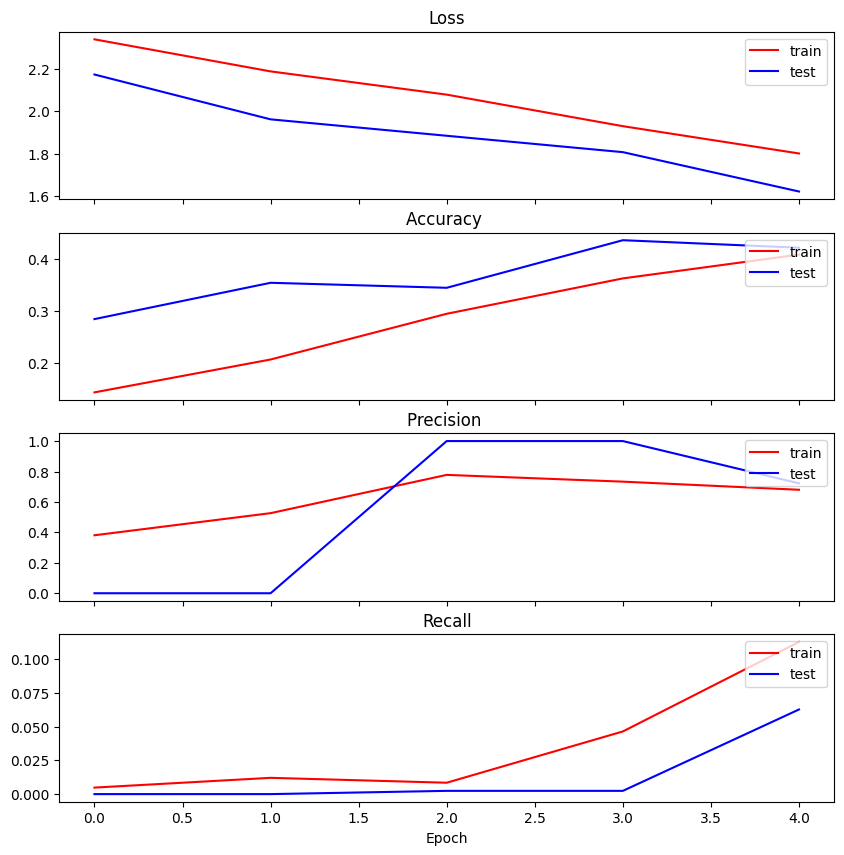

         Model Evaluation on Training :
     Training Loss:     1.5624972581863403
   Training Accuracy:   0.5002409815788269
  Training Precision:   0.8644067645072937
    Training Recall:    0.07373493909835815 

         Model Evaluation on Validation :
    Validation Loss:    1.7705326080322266
  Validation Accuracy:  0.41781875491142273
 Validation Precision:  1.0
   Validation Recall:   0.061443932354450226


In [35]:
# to save the models & the metrics
models_cnn = {}

# early stopping critera
es = EarlyStopping(patience=20, restore_best_weights=True)

for batch in [4,16,32,64] :
    
    model = init_model()
    
    history = model.fit(
        X_train,
        y_train_cat,
        validation_split=0.2,
        epochs = 5,
        batch_size = batch, 
        verbose = 0, 
        callbacks = [es]
    )
    
    print(f'------------------------------------------Batch Size {batch}------------------------------------------')
    
    # store the model
    models_cnn[batch] = model
        
    # plot the history of loss and accuracy
    plot_history(history)
    
    # print the evaluation of the model:
    trainEval = model.evaluate(X_train,y_train_cat, verbose=0)
    valEval = model.evaluate(X_val,y_val_cat, verbose=0)

    print("         Model Evaluation on Training :")
    print("     Training Loss:    ", trainEval[0])
    print("   Training Accuracy:  ", trainEval[1])
    print("  Training Precision:  ", trainEval[2])
    print("    Training Recall:   ", trainEval[3], '\n')
    print("         Model Evaluation on Validation :")
    print("    Validation Loss:   ", valEval[0])
    print("  Validation Accuracy: ", valEval[1])
    print(" Validation Precision: ", valEval[2])
    print("   Validation Recall:  ", valEval[3])

## 2) Transfer Learning

## VGG16

In [41]:
from tensorflow.keras.applications import VGG16

def init_model_with_pretrained_base(base_model):
    base_model.trainable = False  # Geler les couches du modèle pré-entraîné

    model = models.Sequential([
        base_model,
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(13, activation='softmax')  # Adaptez à votre nombre de classes
    ])
    
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'Precision', 'Recall'])
    
    return model

# Chargement de VGG16 comme base
base_model_vgg16 = VGG16(include_top=False, input_shape=(138, 171, 3), weights='imagenet')

# Initialisation du modèle avec VGG16 comme base
model_vgg16 = init_model_with_pretrained_base(base_model_vgg16)


Epoch 1/10
52/52 [==============================] - 78s 1s/step - loss: 1.7708 - accuracy: 0.4687 - precision: 0.5699 - recall: 0.2898 - val_loss: 0.9398 - val_accuracy: 0.6602 - val_precision: 0.8494 - val_recall: 0.5301
Epoch 2/10
52/52 [==============================] - 72s 1s/step - loss: 0.8616 - accuracy: 0.7175 - precision: 0.8627 - recall: 0.5831 - val_loss: 0.6866 - val_accuracy: 0.7542 - val_precision: 0.8875 - val_recall: 0.6843
Epoch 3/10
52/52 [==============================] - 74s 1s/step - loss: 0.6554 - accuracy: 0.7916 - precision: 0.8904 - recall: 0.6952 - val_loss: 0.6114 - val_accuracy: 0.8048 - val_precision: 0.9006 - val_recall: 0.7205
Epoch 4/10
52/52 [==============================] - 75s 1s/step - loss: 0.4887 - accuracy: 0.8512 - precision: 0.9213 - recall: 0.7825 - val_loss: 0.5129 - val_accuracy: 0.8434 - val_precision: 0.9209 - val_recall: 0.7855
Epoch 5/10
52/52 [==============================] - 73s 1s/step - loss: 0.3909 - accuracy: 0.8807 - precision: 0

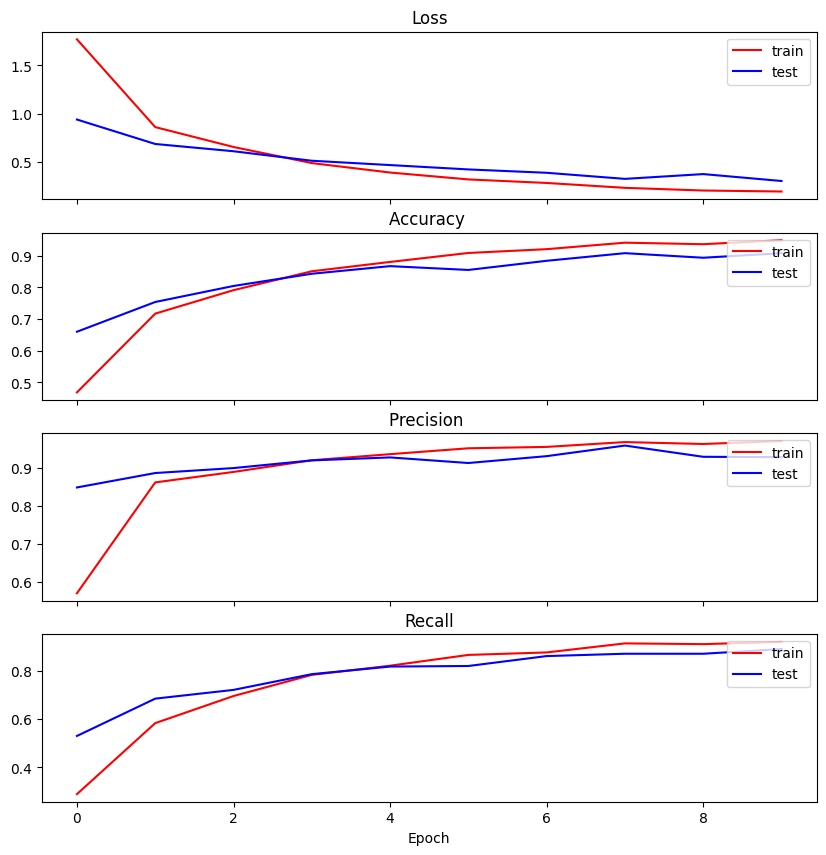

In [42]:
# Initialisation du modèle VGG16
model_vgg16 = init_model_with_pretrained_base(base_model_vgg16)


# Entraînement
history_vgg16 = model_vgg16.fit(
    X_train, y_train_cat,
    validation_split=0.2,
    epochs=10,
    batch_size=32,
    verbose=1,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

# Évaluation
plot_history(history_vgg16)


## ResNet50

Epoch 1/10
52/52 [==============================] - 51s 858ms/step - loss: 4.1411 - accuracy: 0.1861 - precision: 0.1798 - recall: 0.0494 - val_loss: 2.0823 - val_accuracy: 0.2602 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
52/52 [==============================] - 42s 807ms/step - loss: 2.1386 - accuracy: 0.2229 - precision: 0.3617 - recall: 0.0102 - val_loss: 1.9334 - val_accuracy: 0.2410 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
52/52 [==============================] - 41s 783ms/step - loss: 2.1918 - accuracy: 0.2277 - precision: 0.2973 - recall: 0.0066 - val_loss: 1.9967 - val_accuracy: 0.2410 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/10
52/52 [==============================] - 40s 776ms/step - loss: 2.1014 - accuracy: 0.2404 - precision: 0.1667 - recall: 6.0241e-04 - val_loss: 1.9271 - val_accuracy: 0.2410 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/10
52/52 [==============================] - 41s 780ms/st

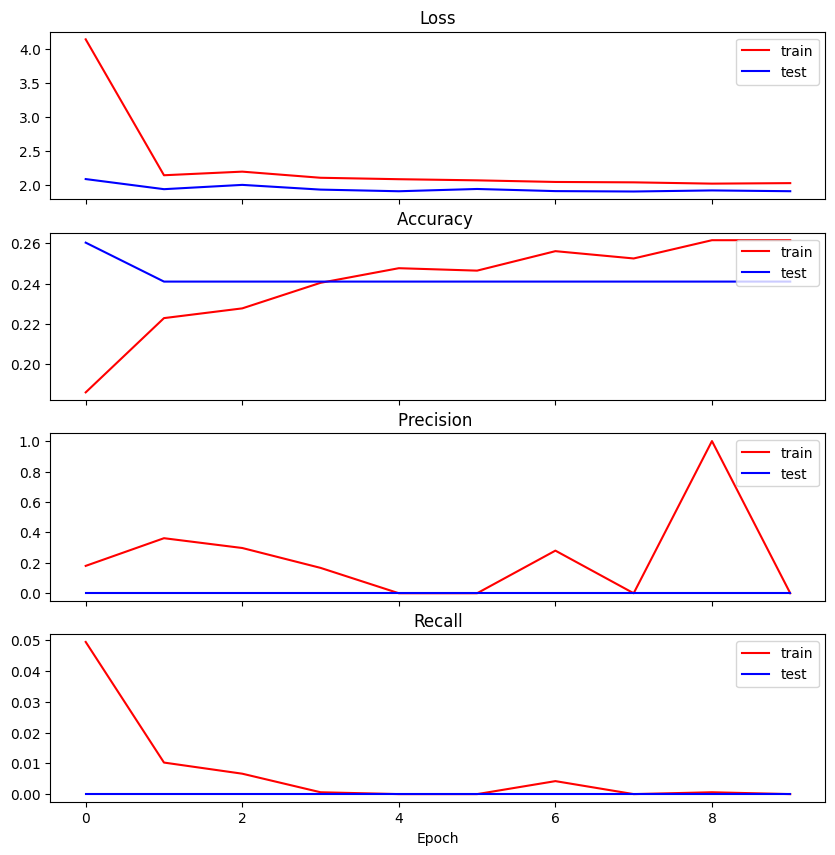

In [38]:
from tensorflow.keras.applications import ResNet50

base_model_resnet50 = ResNet50(include_top=False, input_shape=(138, 171, 3), weights='imagenet')
model_resnet50 = init_model_with_pretrained_base(base_model_resnet50)



# Chargement de ResNet50 comme base
base_model_resnet50 = ResNet50(include_top=False, input_shape=(138, 171, 3), weights='imagenet')

# Initialisation du modèle avec ResNet50 comme base
model_resnet50 = init_model_with_pretrained_base(base_model_resnet50)

# Entraînement
history_resnet50 = model_resnet50.fit(
    X_train, y_train_cat,
    validation_split=0.2,
    epochs=10,  
    batch_size=32,
    verbose=1,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

# Évaluation
plot_history(history_resnet50)


## EfficientNet

In [57]:
from tensorflow.keras.applications import EfficientNetB5

def init_model_with_efficientnet():
    base_model = EfficientNetB5(include_top=False, weights='imagenet', input_shape=(138, 171, 3))
    base_model.trainable = False  # Freeze the base model

    # Création du modèle
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(1024, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(13, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'Precision', 'Recall'])
    
    return model


Epoch 1/10
52/52 [==============================] - 90s 1s/step - loss: 2.1106 - accuracy: 0.2090 - precision: 0.2222 - recall: 0.0145 - val_loss: 1.8769 - val_accuracy: 0.2386 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
52/52 [==============================] - 58s 1s/step - loss: 1.9388 - accuracy: 0.2518 - precision: 0.3000 - recall: 0.0072 - val_loss: 1.9154 - val_accuracy: 0.3229 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
52/52 [==============================] - 59s 1s/step - loss: 1.9311 - accuracy: 0.2675 - precision: 0.4667 - recall: 0.0042 - val_loss: 1.8873 - val_accuracy: 0.2578 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/10
52/52 [==============================] - 57s 1s/step - loss: 1.9014 - accuracy: 0.2675 - precision: 0.3750 - recall: 0.0018 - val_loss: 1.9695 - val_accuracy: 0.2554 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/10
52/52 [==============================] - 58s 1s/step - loss: 1.8914 -

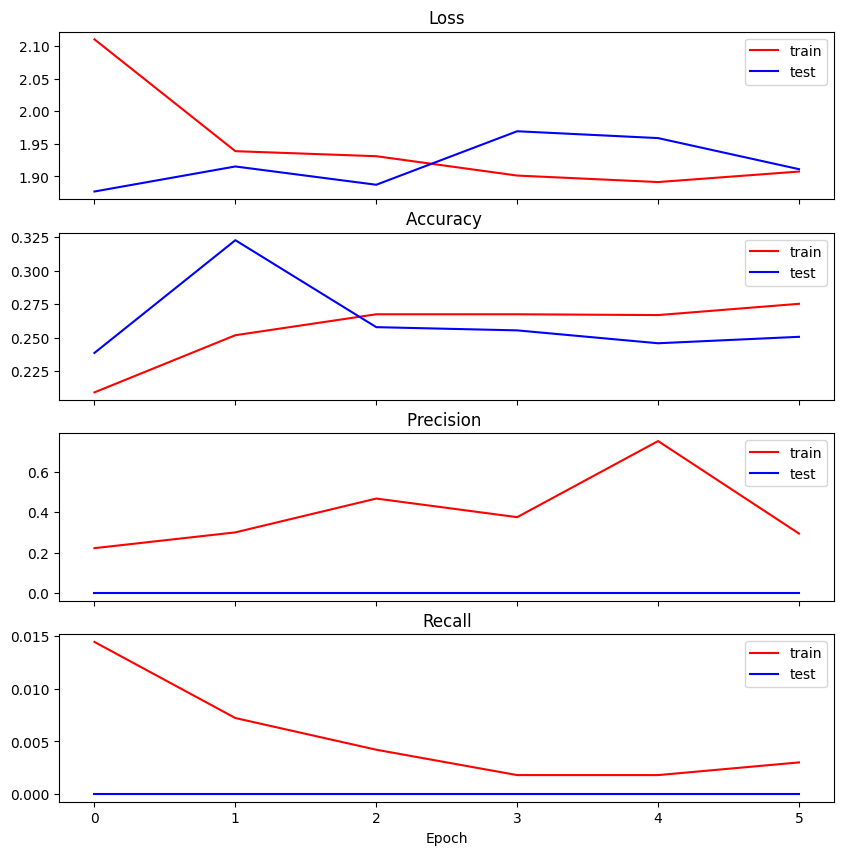

In [58]:
# Initialisation du modèle avec EfficientNet
model_efficientnet = init_model_with_efficientnet()

# Entraînement
history_efficientnet = model_efficientnet.fit(
    X_train, y_train_cat,
    validation_split=0.2,
    epochs=10,  # Ajustez selon vos besoins
    batch_size=32,
    verbose=1,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

# Évaluation
plot_history(history_efficientnet)


### MobileNetV2

In [59]:
from tensorflow.keras.applications import MobileNetV2

def init_model_with_mobilenetV2():
    base_model = MobileNetV2(include_top=False, weights='imagenet', input_shape=(138, 171, 3))
    base_model.trainable = False  # Gel des couches du modèle pré-entraîné

    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(1024, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(13, activation='softmax')  # Adaptez en fonction du nombre de vos classes
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'Precision', 'Recall'])
    
    return model


Epoch 1/10
52/52 [==============================] - 17s 230ms/step - loss: 1.0906 - accuracy: 0.6825 - precision: 0.7518 - recall: 0.6241 - val_loss: 0.6404 - val_accuracy: 0.7807 - val_precision: 0.8260 - val_recall: 0.7205
Epoch 2/10
52/52 [==============================] - 11s 207ms/step - loss: 0.3360 - accuracy: 0.9000 - precision: 0.9241 - recall: 0.8584 - val_loss: 0.3273 - val_accuracy: 0.8771 - val_precision: 0.9067 - val_recall: 0.8434
Epoch 3/10
52/52 [==============================] - 10s 198ms/step - loss: 0.1394 - accuracy: 0.9627 - precision: 0.9734 - recall: 0.9476 - val_loss: 0.2197 - val_accuracy: 0.9181 - val_precision: 0.9310 - val_recall: 0.9108
Epoch 4/10
52/52 [==============================] - 10s 190ms/step - loss: 0.0794 - accuracy: 0.9831 - precision: 0.9878 - recall: 0.9753 - val_loss: 0.3011 - val_accuracy: 0.9036 - val_precision: 0.9158 - val_recall: 0.8916
Epoch 5/10
52/52 [==============================] - 11s 203ms/step - loss: 0.0435 - accuracy: 0.9922

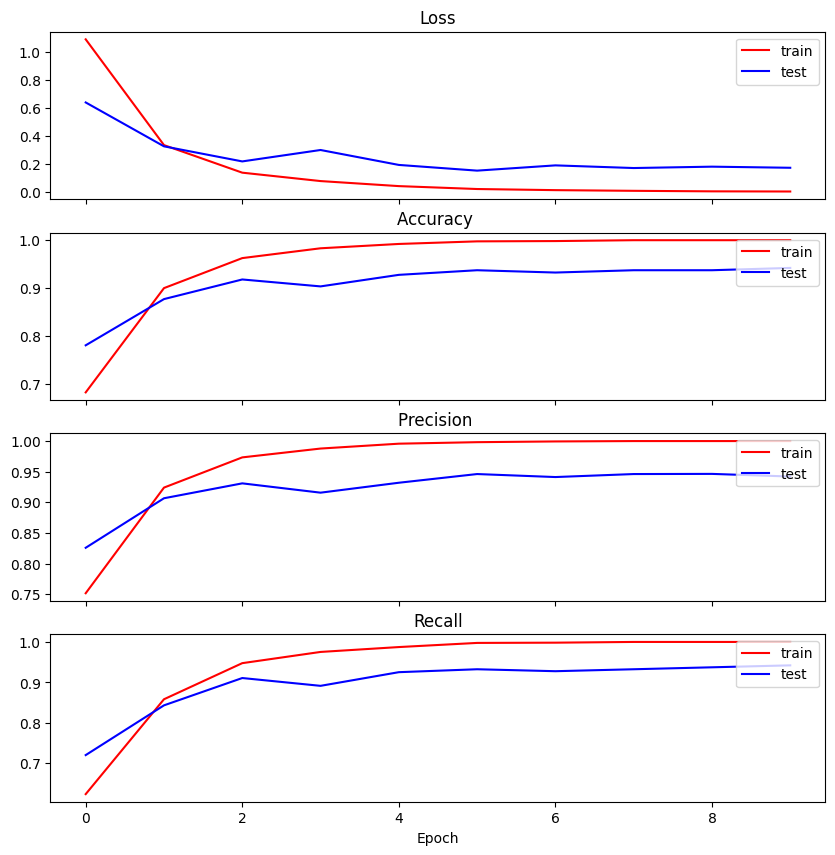

In [60]:
# Initialisation du modèle avec MobileNetV2
model_mobilenetV2 = init_model_with_mobilenetV2()

# Entraînement
history_mobilenetV2 = model_mobilenetV2.fit(
    X_train, y_train_cat,
    validation_split=0.2,
    epochs=10,  # Ajustez selon vos besoins
    batch_size=32,  # Ou tout autre nombre qui convient à votre configuration
    verbose=1,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

# Évaluation
plot_history(history_mobilenetV2)

## Comparaison entre les modèles

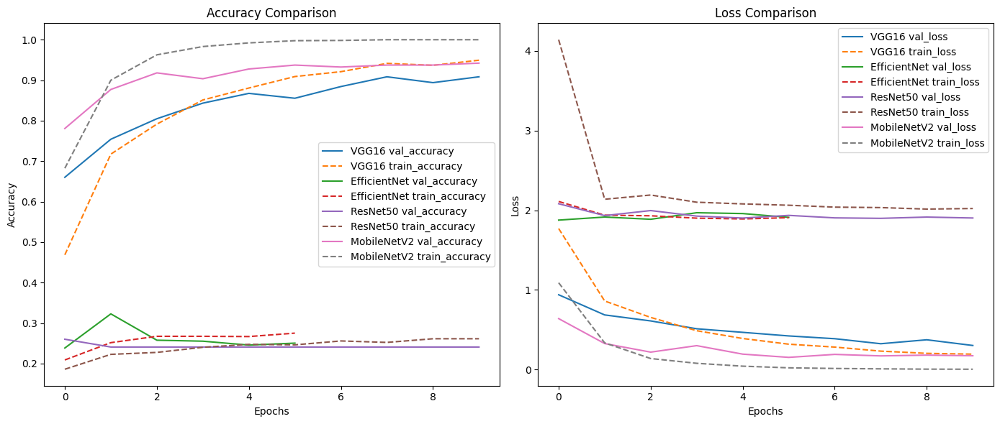

In [61]:
def compare_models(histories, names):
    plt.figure(figsize=(14, 6))
    
    # Accuracy
    plt.subplot(1, 2, 1)
    for name, history in zip(names, histories):
        plt.plot(history.history['val_accuracy'], label=f'{name} val_accuracy')
        plt.plot(history.history['accuracy'], '--', label=f'{name} train_accuracy')
    plt.title('Accuracy Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Loss
    plt.subplot(1, 2, 2)
    for name, history in zip(names, histories):
        plt.plot(history.history['val_loss'], label=f'{name} val_loss')
        plt.plot(history.history['loss'], '--', label=f'{name} train_loss')
    plt.title('Loss Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Supposons que vous ayez l'historique d'EfficientNet et de MobileNetV2, et potentiellement d'autres
compare_models([history_vgg16, history_efficientnet, history_resnet50, history_mobilenetV2], ['VGG16','EfficientNet', 'ResNet50', 'MobileNetV2'])